# TP 1 : Multiplexage fréquentiel

> *Compte-rendu proposé par Emmanuel MATON & Pauline NAVET - MPiE 2022/2023*



## OBJECTIF GÉNÉRAL : Étudier comment récupérer un signal lors d'une transmission par multiplexage fréquentiel



### Question 1

##### Objectif :
Réaliser un filtre passe-bande

##### Protocole :
Matériel :
- GBF délivrant un signal sinusoïdal de fréquence f=1kHz
- $R_1 = R_2 = 1kΩ$
- $R_3 = 100kΩ$
- $C_1 = C_2 = 10nF$
- ALI 
- oscilloscope


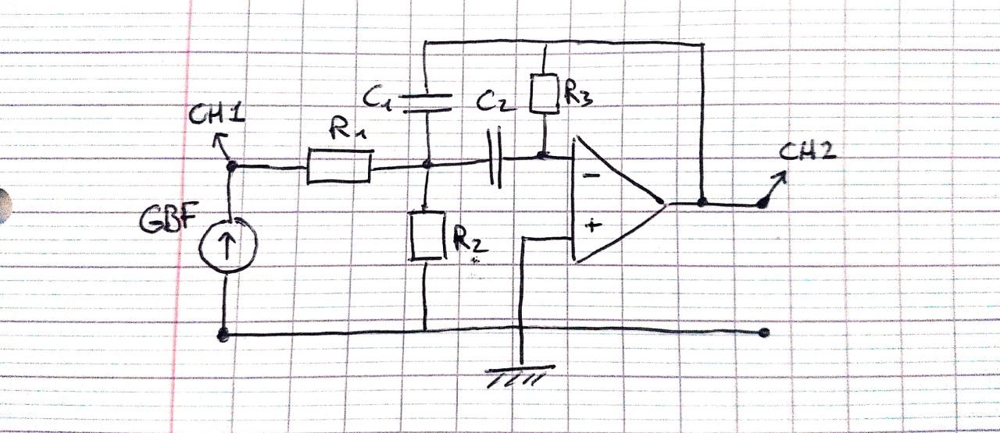   </img>

> *Sur le schéma du montage, doivent également apparaître le placement du GBF, le type de signal mis en entrée, ainsi que les "positions" des chaînes de l'oscilloscope*

Précautions à prendre : 
- Alimenter l'ALI avant de soumettre le signal d'entrée
- (Question 4.) L'amplitude du signal d'entrée doit être telle qu'en la multipliant par $|H(\omega=\omega_0)| = 50$, elle ne dépasse pas les 15V et -15V de l'ALI, sinon il y a saturation à la résonance (cf ci-dessous).

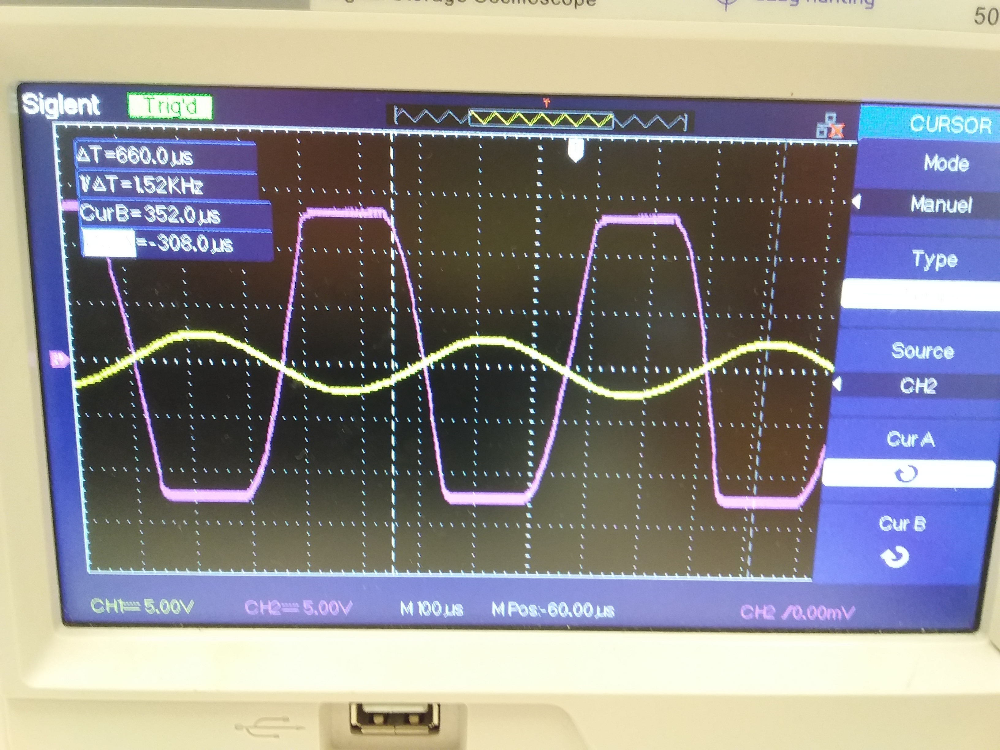 <img/>


Pour trouver la fréquence de résonance : 

Faire varier la fréquence du signal d'entrée et relever la fréquence pour laquelle l'amplitude du signal de sortie est maximale.

##### Résultats :

- En basses fréquences ($f = 100Hz$) :
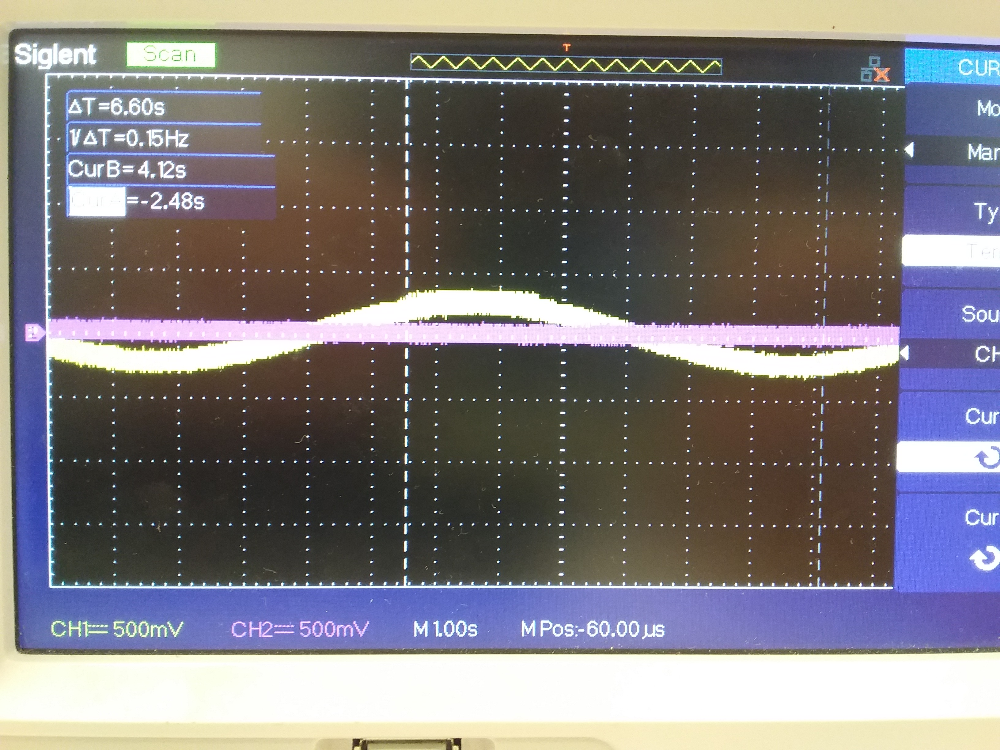 <img/>

- A la résonance ($f = f_{res}$) :
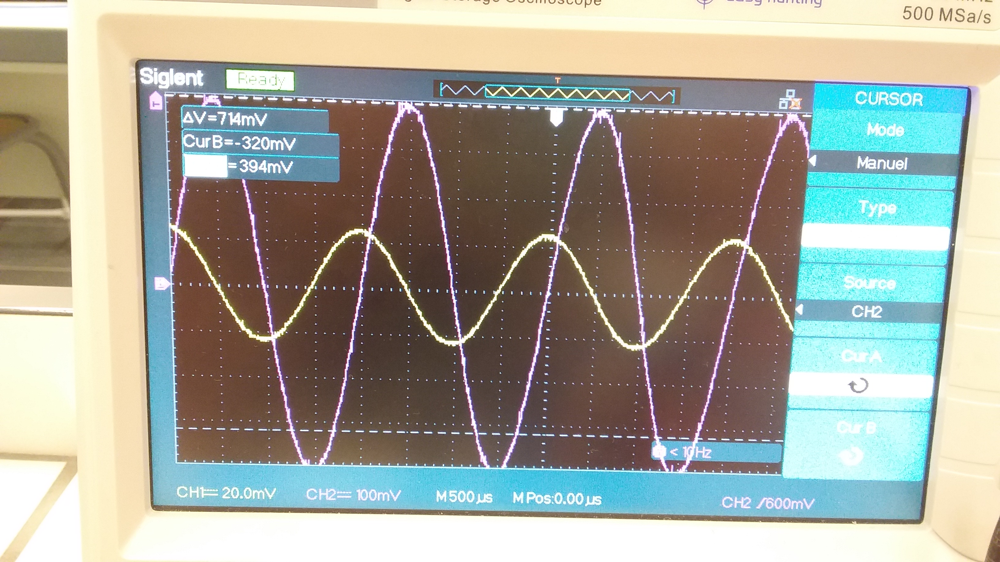 <img/>

>*Attention, on n'est pas rigoureusement à la résonance sur cette photo car, on a montré qu'à la résonance $v_s=-50\times v_e$ : les signaux d'entrée et de sortie doivent être en opposition de phase à la résonance. Ce n'est pas le cas sur la photo. Toutefois, l'idée de cette photo était de montrer que pour des fréquences proches de la résonance, on a une sinusoïde de sortie d'amplitude importante (pas comme en BF et HF où la sinusoïde de sortie a une amplitude tendans vers 0.*

- En hautes fréquences ($f = 122kHz$) :
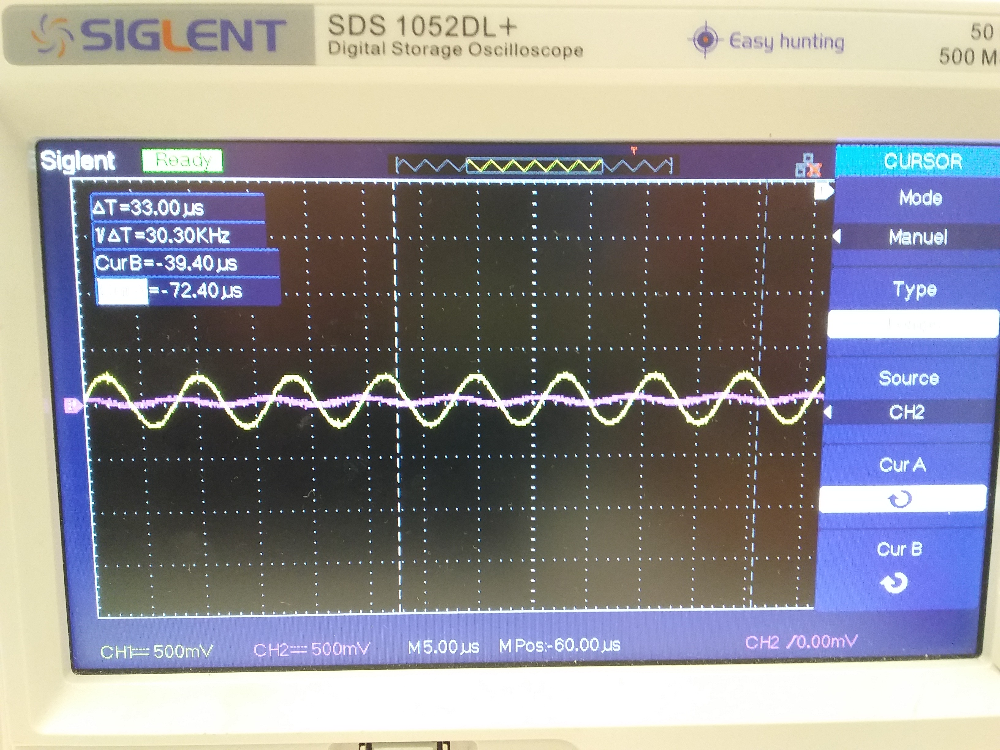

Les signaux de couleur jaune correspondent aux signaux d'entrée, et ceux de couleur violette aux signaux de sortie.


On observe que l'amplitude du signal de sortie est maximale entre $f_1 = 2.100kHz$ et $f_2 = 2.400kHz$, on relève $f_{res} = 2.200kHz$ et $u(f_{res}) = 87Hz$. 

##### Analyse / Commentaires :
- Le signal de sortie est coupé en basses et hautes fréquences : il s'agit bien d'un filtre passe-bande.
- La fréquence de résonance théorique est f_res_th = 2.250kHz donc la valeur expérimentale est valide (elle appartient à l'intervalle de confiance à 95%). 


## Question 2

##### Analyse/Commentaires :

Le mode XY ou "Lissajoux" est particulièrement adapté pour détecter avec précision la fréquence de résonance car il trace l'amplitude du signal de sortie en fonction de l'amplitude du signal d'entrée. Or, le gain maximal est atteint à la résonance pour un passe-bande donc on doit observer une droite. On a bien une droite à la résonance de pente -50, pour $f_{res} = 2.250kHz$.

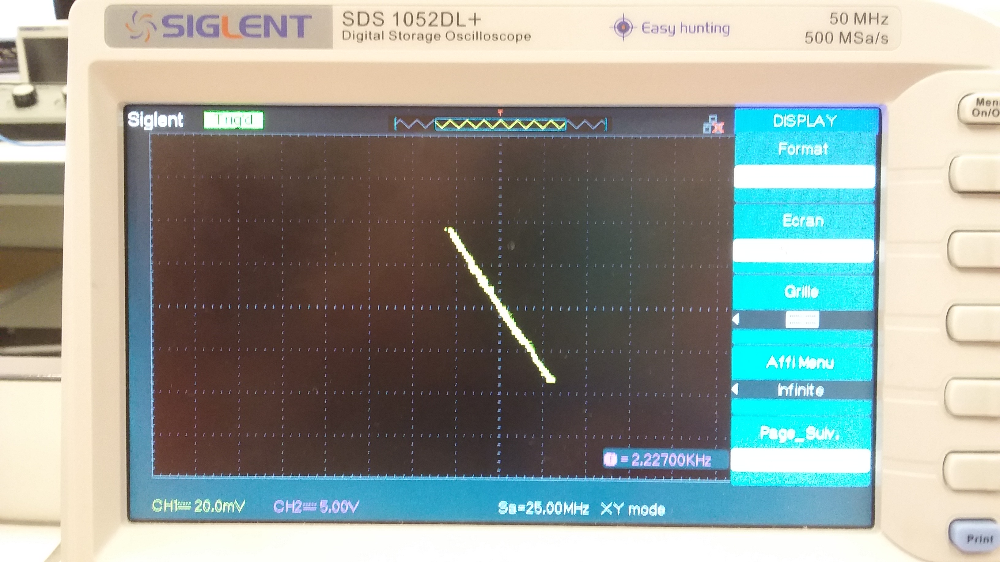 <img/>

> *Il aurait été intéressant également de déterminer l'incertitude type sur $f_{res}$, obtenue par cette méthode. On aurait ainsi montré qu'elle était inférieure à celle de la question précédente.*


## Question 3

###### Objectif :
On peut également vérifier qu'il s'agit bien d'un filtre passe-bande en traçant le diagramme de Bode. 

###### Protocole :

On relève l'amplitude de la sortie S et de l'entrée E ainsi que le retard temporel Δt de la sortie sur l'entrée, et on trace le gain G et la phase φ  en fonction de la fréquence f (en échelle log).

$$G_{dB} = 20\log(\frac{S}{E})$$
$$φ = \pm 2π  Δt  f$$
en prenant le signe $-$ si la sortie est en retard sur l'entrée.


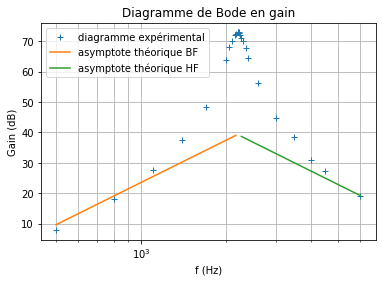

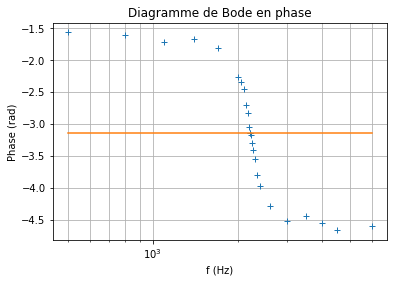

G_max = 72.8 dB


In [14]:
import numpy as np
import matplotlib.pyplot as plt

f = np.array([500,800,1100,1400,1700,2000,2050,2100,2150,2170,2200,2210,2220,2230,2250,2270,2300,2350,2400,2600,3000,3500,4000,4500,6000])
amp_e=np.array([288e-3]*25)
amp_s=np.array([428e-3,708e-3,1.14,1.88,3.22,7,8.6,9.6,10.5,10.8,11,11,11,10.9,10.6,10.1,9.5,8.5,7.2,4.8,2.72,1.96,1.36,1.13,0.750])
delta_t=np.array([0.5e-3,0.320e-3,0.250e-3,0.190e-3,0.170e-3,0.180e-3,0.182e-3,0.186e-3,0.200e-3,0.208e-3,0.221e-3,0.226e-3,0.225e-3,0.227e-3,0.233e-3,0.239e-3,0.246e-3,0.258e-3,0.264e-3,0.262e-3,0.240e-3,0.202e-3,0.181e-3,0.165e-3,0.122e-3])


G=20*np.log([amp_s[i]/amp_e[i] for i in range(amp_e.size)])
phi=-2*np.pi*delta_t*f

# on va superposer les asymptotes BF et HF attendues, issues de l'étude théorique
Q=7
w0=2*3.14*2.2e3
f0=w0/(2*3.14)
Hmax=50

asyBF=20*np.log(Hmax*f/(Q*f0))
asyHF=20*np.log(Hmax*f0/(Q*f))

plt.figure()
plt.semilogx(f,G,"+",label="diagramme expérimental")
plt.semilogx(f[0:10],asyBF[0:10],label="asymptote théorique BF")
plt.semilogx(f[-10:], asyHF[-10:],label="asymptote théorique HF")
plt.title("Diagramme de Bode en gain")
plt.xlabel("f (Hz)")
plt.ylabel("Gain (dB)")
plt.legend()
plt.grid(which="both")
plt.show()

plt.figure()
plt.semilogx(f,phi,'+',f,-3.14*np.array([1]*len(f)))
plt.title("Diagramme de Bode en phase")
plt.xlabel("f (Hz)")
plt.ylabel("Phase (rad)")
plt.grid(which="both")
plt.show()
print("G_max =" , str(max(G))[0:4], "dB")

- Graphiquement, on peut vérifier la fréquence de résonance en relevant l'abscisse pour laquelle la phase vaut -π/2 : $f_{res} = 2220Hz$.
- En traçant les asymptotes pour le diagramme en gain (nous n'avons pas réussi avec Python donc on l'a fait à la main), on trouve des pentes de +65dB/décade et -102dB/décade : ce qui n'est pas du tout cohérent avec un filtre passe-bande. Nous pensons qu'il faudrait plus de valeurs en basses et hautes fréquences pour avoir une vue plus complète du diagramme et notamment sur les décades.
> *Oui, ce résultat de pentes est très bizarre et faux. Je me suis permis de rajouter les tracés des asymptotes théoriques HF et BF sur votre graphe : on voit que cela colle bien, mais, qu'en effet, vous auriez dû prendre plus de points en HF et BF pour les voir clairement apparaître*

- Avec l'intersection des asymptotes, on peut retrouver le facteur de qualité $Q$. En effet, la distance entre l'ordonnée du croisement des asymptotes et l'ordonnée du maximum du diagramme réel est, d'après l'étude théorique : $20\log(Q)$. Ce qui donne $Q = 10^{\frac{17}{20}} = 7.1$ (cela correspond à ce que nous avions trouvé avec la théorie).

## Question 5

##### Objectif :

Étudier le comportement du filtre sur un signal d'entrée créneau de fréquence $f = 446Hz$

##### Protocole :

Reprendre le montage du filtre précédent et soumettre au GBF un signal créneau de fréquence $f = 446Hz$.

##### Résultats :

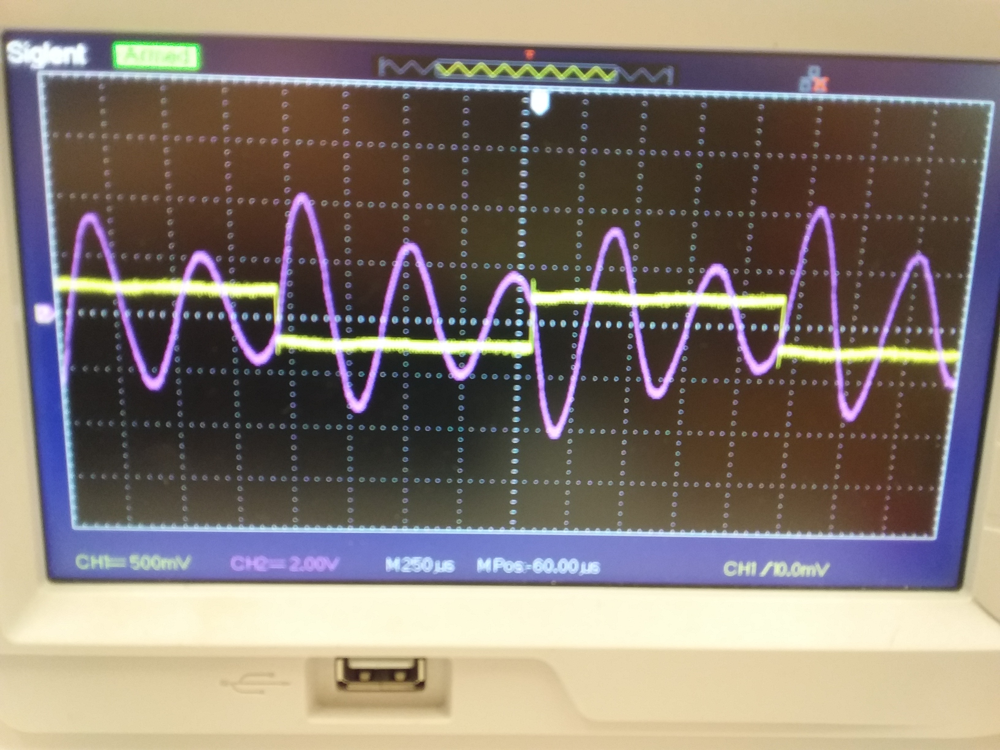 <img/>

## Question 6.

##### Analyse / Commentaires :

- On observe en sortie une somme de sinusoïdes dont l'une est particulièrement prépondérante : on remarque que, en effet, une période du signal d'entrée correspond à 5 périodes du signal de sortie. 
- On remarque également que $5f = f_{res}$.

Nous avons donc isolé l'harmonique de rang 5 (et quelques résidus des harmoniques de rangs proches, ce qui explique que la sinusoïde de sortie ne soit pas pure).

On peut le prouver en utilisant la fonction Transformée de Fourier Rapide de l'oscilloscope et ainsi obtenir les spectres pour chaque signal.

Pour le signal d'entrée, on observe :
 
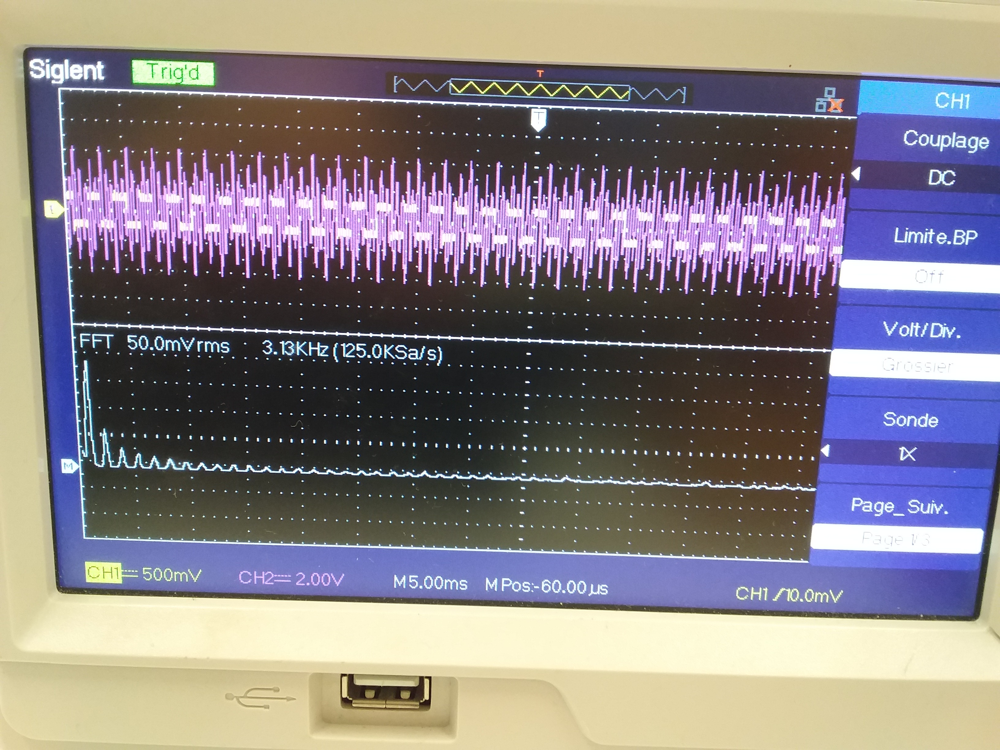 <img/>

Pour le signal de sortie (nous n'avons pas de photo),  on observe sur le spectre que l'amplitude de l'harmonique de rang 5 est amplifiée, alors que les autres harmoniques et le fondamental sont pratiquement tous coupés. Le fondamental et les fréquences de basses et hautes fréquences ont été filtrés alors que les harmoniques de rang 3, 5 et 7 se trouvent au niveau de la bande passante et notamment de $f_{res}$.

> *C'est surtout l'harmonique de rang 5 qui est dans la bande passante. Les autres sont coupées, mais il reste un résidu de rang 3 et de fondamental car : elles avaient une amplitude nettement plus grande que l'harmonique de rang 5 en entrée, et que, même si elles sont hors de la bande passante, elles ne sont pas complètement coupées.*

On pourrait améliorer le procédé en augmentant $Q$ (car $\Delta\omega = \frac{\omega_0}{Q}$ et on a $\omega_0 = \omega_{res}$). En effet, on diminuerait ainsi la largeur de la bande passante et seule l'harmonique de rang 5 passerait (les harmoniques de rang 3 et 7, ainsi que le fondamental seraient davantage coupées) et on aurait une sinusoïde pure.



## Question 7.

##### Objectif :

Démontrer le caractère intégrateur du filtre

##### Protocole :

Reprendre le filtre précédent (filtre passe-bande).

En hautes fréquences, l'équivalent de sa fonction de transfert est : 

$$H = \frac{H_0 \omega_0}{jQ\omega}$$

Il faut ainsi se placer en hautes fréquences pour observer le caractère intégrateur du filtre passe-bande : soumettre au GBF un signal d'entrée créneau de fréquence f = 22kHz. 

##### Résultats :

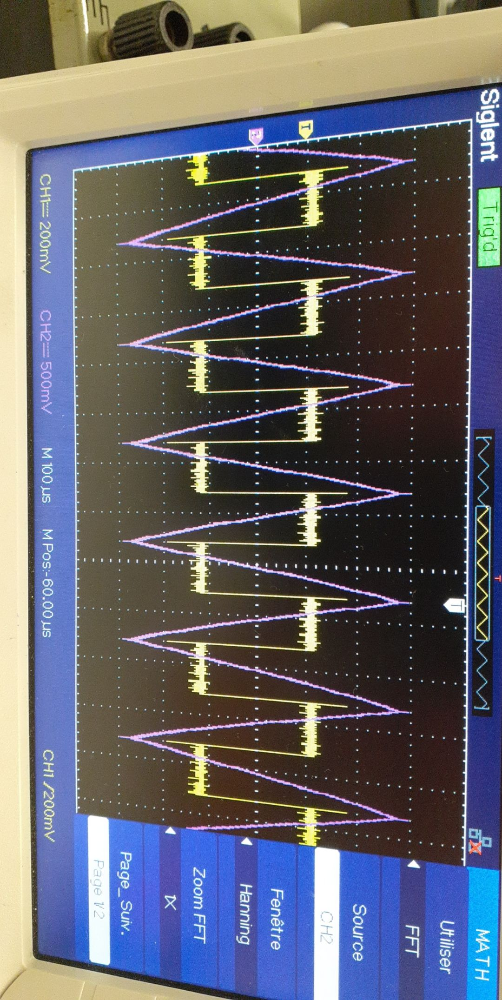 <img/>

##### Analyse / Commentaires :

On obtient un signal de sortie triangulaire, ce qui prouve le caractère intégrateur de notre filtre.




## Question 8.

##### Objectif :

Démontrer le caractère dérivateur du filtre

##### Protocole :

Reprendre le filtre précédent (filtre passe-bande).

En basses fréquences, l'équivalent de sa fonction de transfert est : 
$$H = \frac{jH_0\omega}{Q\omega_0}$$

Il faut ainsi se placer en basses fréquences pour observer le caractère dérivateur du filtre passe-bande : soumettre au GBF un signal d'entrée créneau de fréquence $f = 200Hz$. 
On peut augmenter l'amplitude du signal d'entrée pour diminuer l'influence du bruit.

##### Résultats :

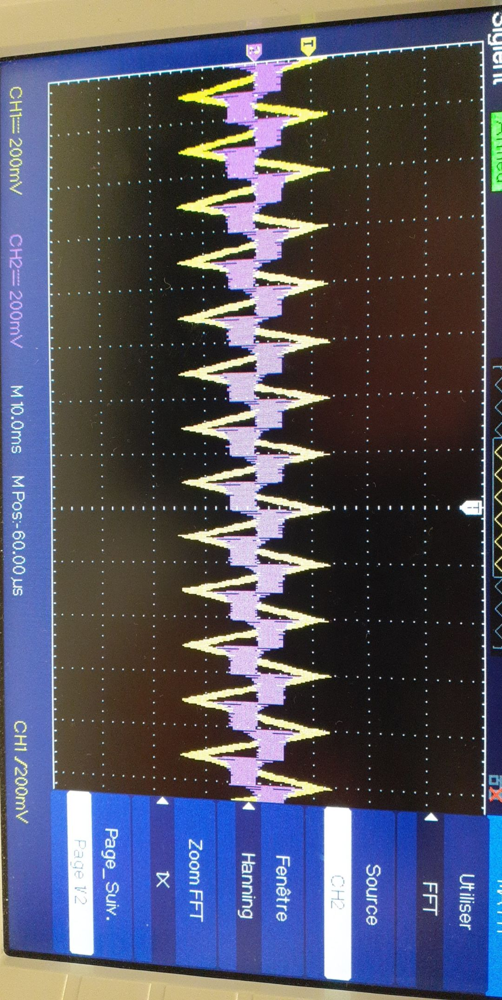 <img/>

##### Analyse / Commentaires :

On obtient un signal de sortie créneau, ce qui prouve le caractère intégrateur de notre filtre.
Cependant, il présente des imperfections, des discontinuités dûes aux hautes fréquences : les harmoniques de haute fréquence sont présentes dans la bande passante du filtre et ne sont donc pas filtrées.
On peut alors décaler le fondamental pour que toutes les harmoniques soient dérivées.

### Synthèse du TP

L'objectif était de récupérer un canal au sein d'un signal multiplexé. Avec le filtre que nous avons réalisé, nous avons pu isoler une harmonique de rang $n$ (tel que $n*f_{entrée} = f_{res}$)  d'un signal d'entrée. Nous avons également étudié les caractères intégrateur et dérivateur de notre filtre passse-bande et remarqué qu'il était plus facile d'intégrer le signal d'entrée que de le dériver puisque dans ce cas, il faut faire particulièrement attention à ce que toutes les harmoniques soient filtrées.